In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import (
    datasets, metrics, model_selection as skms, neighbors, naive_bayes
)

In [15]:
dataset = datasets.load_breast_cancer()
dataframe = pd.DataFrame(dataset.data, columns=dataset.feature_names)
dataframe["target"] = dataset.target
dataframe

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0


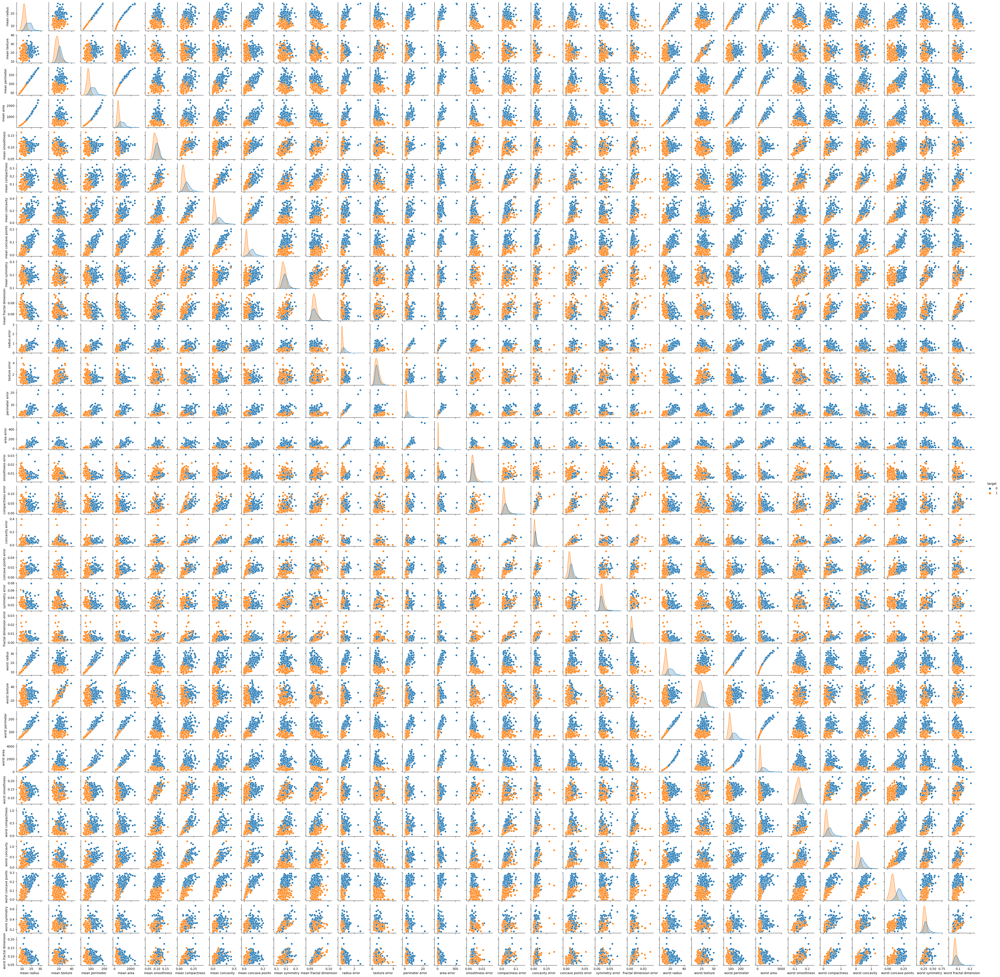

In [9]:
# visualising the dataset
sns.pairplot(dataframe, hue="target", size=1.5)

In [14]:
# splitting the dataset into the training and the testing features and the target variables
(dataset_train_ftrs, dataset_test_ftrs, dataset_train_trgt, dataset_test_trgt) = skms.train_test_split(dataset.data, dataset.target, test_size=0.25, random_state=42)
dataset_train_ftrs, dataset_test_ftrs, dataset_train_trgt, dataset_test_trgt

(array([[1.289e+01, 1.312e+01, 8.189e+01, ..., 5.366e-02, 2.309e-01,
         6.915e-02],
        [1.340e+01, 2.052e+01, 8.864e+01, ..., 2.051e-01, 3.585e-01,
         1.109e-01],
        [1.296e+01, 1.829e+01, 8.418e+01, ..., 6.608e-02, 3.207e-01,
         7.247e-02],
        ...,
        [1.429e+01, 1.682e+01, 9.030e+01, ..., 3.333e-02, 2.458e-01,
         6.120e-02],
        [1.398e+01, 1.962e+01, 9.112e+01, ..., 1.827e-01, 3.179e-01,
         1.055e-01],
        [1.218e+01, 2.052e+01, 7.722e+01, ..., 7.431e-02, 2.694e-01,
         6.878e-02]]),
 array([[1.247e+01, 1.860e+01, 8.109e+01, ..., 1.015e-01, 3.014e-01,
         8.750e-02],
        [1.894e+01, 2.131e+01, 1.236e+02, ..., 1.789e-01, 2.551e-01,
         6.589e-02],
        [1.546e+01, 1.948e+01, 1.017e+02, ..., 1.514e-01, 2.837e-01,
         8.019e-02],
        ...,
        [1.104e+01, 1.683e+01, 7.092e+01, ..., 7.431e-02, 2.998e-01,
         7.881e-02],
        [1.981e+01, 2.215e+01, 1.300e+02, ..., 2.388e-01, 2.768e-01,
   

In [16]:
# models to evaluate the accuracy of the predictions
models = {
    "knn": neighbors.KNeighborsClassifier(n_neighbors=3),
    "nb": naive_bayes.GaussianNB()
}

In [21]:
for model_name, model in models.items():
    fit = model.fit(dataset_train_ftrs, dataset_train_trgt)
    preds = model.predict(dataset_test_ftrs)
    accuracy = metrics.accuracy_score(dataset_test_trgt, preds)
    print(f"{model_name} : {accuracy}")

knn : 0.9300699300699301
nb : 0.958041958041958
